In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

## Load file: eth SiNGMR

In [2]:
data_folder = 'eth'
# Gray
Gray_file = f'{data_folder}/ResultGrayMi.csv'
df_gray = pd.read_csv(Gray_file)

#Red
Red_file = f'{data_folder}/ResultRedMi.csv'
df_red = pd.read_csv(Red_file)

#Green
Green_file = f'{data_folder}/ResultGreenMi.csv'
df_green = pd.read_csv(Green_file)

#Blue
Blue_file = f'{data_folder}/ResultBlueMi.csv'
df_blue = pd.read_csv(Blue_file)

### Create a new row with column names

In [3]:
def create_columns_name(df):
    # Create a new row with numerical column names
    column_names = ['time'] + [f'sensor_{i}' for i in range(1, len(df.columns))]
    df_processed = pd.DataFrame([column_names] + df.values.tolist())

    # Update the column names of the DataFrame
    df_processed.columns = df_processed.iloc[0]

    # Remove the first row (numerical column names)
    df_processed = df_processed.iloc[1:]

    return df_processed


# Process each DataFrame individually
df_gray = create_columns_name(df_gray)
df_red = create_columns_name(df_red)
df_green = create_columns_name(df_green)
df_blue = create_columns_name(df_blue)

In [4]:
df_green

,time,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,sensor_6,sensor_7,sensor_8,sensor_9,...,sensor_54,sensor_55,sensor_56,sensor_57,sensor_58,sensor_59,sensor_60,sensor_61,sensor_62,sensor_63
1,1.459505,-0.075894,-0.116143,0.049789,0.025224,0.047096,-0.048799,0.012493,0.100191,0.074273,...,-0.012588,0.054322,-0.065402,-0.057035,-0.060305,0.012708,-0.053678,0.032377,0.156418,-0.092062
2,2.464196,0.052764,-0.10484,0.011984,0.072815,-0.069367,0.006689,-0.067385,0.033989,0.092276,...,-0.045306,-0.005769,-0.00733,-0.086514,-0.077311,0.064392,0.000586,0.070449,0.145965,-0.013084
3,3.542041,0.141179,-0.045947,-0.047772,0.039501,0.073316,0.092055,0.092981,-0.03744,0.118408,...,0.126615,0.06566,0.033902,0.114167,-0.08128,0.112011,0.048205,-0.048528,0.136093,0.021179
4,4.459153,-0.055162,-0.034049,0.02357,0.063891,0.01417,-0.010384,-0.008848,0.046184,0.070208,...,0.095086,0.068494,0.054227,0.177659,-0.045565,-0.000648,-0.036513,-0.015214,0.122736,0.060087
5,4.968428,0.093008,-0.131015,0.045521,0.020465,0.01234,-0.076238,0.030786,0.127485,0.002845,...,-0.057204,0.112712,0.022287,0.113033,-0.011552,0.056262,-0.092438,0.075803,0.073956,-0.032248
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4359,3952.871229,-3.131992,-2.406446,-1.972162,-2.658298,-3.167538,-2.755506,-2.585068,-3.502597,-2.692858,...,-1.959643,-2.123116,-2.698967,-0.549666,-0.925951,-1.387408,-1.334409,-1.513727,-1.439401,-2.006696
4360,3953.860089,-3.067358,-2.544459,-1.933747,-2.766567,-2.953513,-2.728677,-2.536897,-3.413166,-2.656272,...,-1.989982,-2.160531,-2.645541,-0.491276,-0.878332,-1.347919,-1.294542,-1.598795,-1.394104,-1.920169
4361,3954.796048,-3.089919,-2.549813,-1.961187,-2.720166,-3.03766,-2.779287,-2.673483,-3.456139,-2.596458,...,-1.994741,-2.110644,-2.658898,-0.473135,-0.927652,-1.320044,-1.319459,-1.494096,-1.49515,-1.885906
4362,3955.364912,-3.060041,-2.571229,-1.945943,-2.705888,-2.959001,-2.748799,-2.581409,-3.439879,-2.730605,...,-1.913242,-2.159397,-2.683288,-0.532092,-0.914613,-1.444318,-1.287343,-1.485172,-1.474244,-1.950947


#

# Band Comparison

### STD comparison 

In [5]:
# Compute standard deviation by columns (sensors) for each band
std_gray = np.std(df_gray.iloc[:, 1:], axis=0)
std_red = np.std(df_red.iloc[:, 1:], axis=0)
std_green = np.std(df_green.iloc[:, 1:], axis=0)
std_blue = np.std(df_blue.iloc[:, 1:], axis=0)

# Create a table of standard deviation values
sensors = df_gray.columns[1:]  # Exclude the first column (assuming it contains frame data)
result_table_STD = pd.DataFrame({'Sensor': sensors, 'Gray': std_gray, 'Red': std_red, 'Green': std_green,
                             'Blue': std_blue})

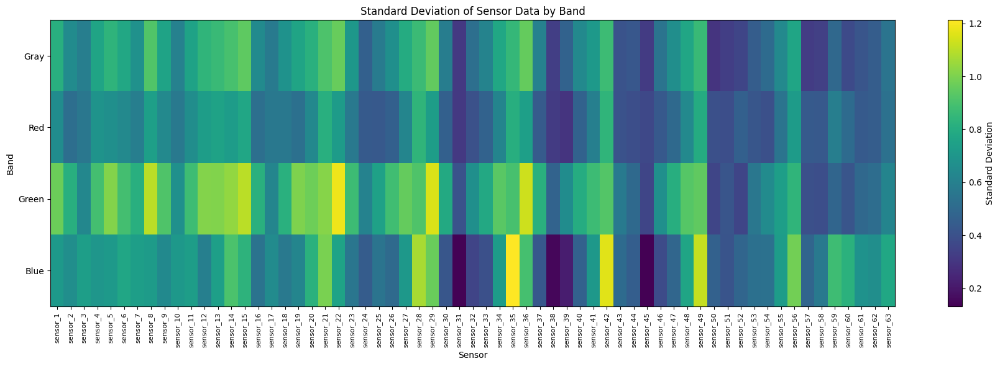

In [6]:
# Visualize the result as a heatmap
result_data = result_table_STD.set_index('Sensor').T
result_data = result_data.apply(pd.to_numeric)  # Convert values to numeric data types
fig, ax = plt.subplots(figsize=(18, 6))
heatmap = ax.imshow(result_data, cmap='viridis', aspect='auto')
plt.colorbar(heatmap, ax=ax, label='Standard Deviation')
ax.set_xticks(np.arange(len(sensors)))
ax.set_xticklabels(sensors, rotation=90, fontsize=8)
ax.set_yticks(np.arange(len(result_data.index)))
ax.set_yticklabels(result_data.index)
ax.set_xlabel('Sensor')
ax.set_ylabel('Band')
ax.set_title('Standard Deviation of Sensor Data by Band')
plt.tight_layout()
plt.show()

#### Most responsive sensors

In [7]:
# Calculate the average std for each band
average_std = result_table_STD[['Gray', 'Red', 'Green', 'Blue']].mean(axis=1)

# Rank the sensors based on their average std values
ranked_sensors = average_std.sort_values(ascending=False)

# Get the top 10 most responsive sensors
top_10_sensors = ranked_sensors.index[:10]

# Print the result
print("\033[1;34mMost responsive sensor\033[0m:", top_10_sensors[0], "(Avg Std:", average_std[top_10_sensors[0]], ")")
print("\n\033[1;34mTop 10 most responsive sensors:\033[0m")
for i, sensor in enumerate(top_10_sensors[1:], start=2):
    suffix = "st" if i == 1 else "nd" if i == 2 else "rd" if i == 3 else "th"
    print(f"{i}{suffix}: {sensor} (Avg Std: {average_std[sensor]:.6f})")

Most responsive sensor: sensor_29 (Avg Std: 0.9521970790514811 )

Top 10 most responsive sensors:
2nd: sensor_42 (Avg Std: 0.950001)
3rd: sensor_35 (Avg Std: 0.942884)
4th: sensor_21 (Avg Std: 0.933290)
5th: sensor_49 (Avg Std: 0.931463)
6th: sensor_36 (Avg Std: 0.929844)
7th: sensor_28 (Avg Std: 0.923085)
8th: sensor_15 (Avg Std: 0.911837)
9th: sensor_22 (Avg Std: 0.906721)
10th: sensor_14 (Avg Std: 0.892192)


#### Most avg highest std band

In [8]:
# Calculate the average std for each band
average_std = result_table_STD[['Gray', 'Red', 'Green', 'Blue']].mean(axis=0)

# Rank the bands based on their average std values
ranked_bands = average_std.sort_values(ascending=False)

# Print the result in blue color
print("\033[94mMost Suitable Band for Further Analysis:\033[0m")
for i, band in enumerate(ranked_bands.index):
    avg_std = average_std[band]
    print(f"{i+1}st: {band} (Avg Std: {avg_std:.4f})")

Most Suitable Band for Further Analysis:
1st: Green (Avg Std: 0.7696)
2st: Blue (Avg Std: 0.6480)
3st: Gray (Avg Std: 0.6450)
4st: Red (Avg Std: 0.5621)


#

### SNR comparison 

In [10]:
# Compute standard deviation by columns (sensors) for each band
std_gray = np.std(df_gray.iloc[:, 1:], axis=0)
std_red = np.std(df_red.iloc[:, 1:], axis=0)
std_green = np.std(df_green.iloc[:, 1:], axis=0)
std_blue = np.std(df_blue.iloc[:, 1:], axis=0)

# Compute mean by columns (sensors) for each band
mean_gray = np.mean(df_gray.iloc[:, 1:], axis=0)
mean_red = np.mean(df_red.iloc[:, 1:], axis=0)
mean_green = np.mean(df_green.iloc[:, 1:], axis=0)
mean_blue = np.mean(df_blue.iloc[:, 1:], axis=0)

# Compute SNR for each band
snr_gray = mean_gray / std_gray
snr_red = mean_red / std_red
snr_green = mean_green / std_green
snr_blue = mean_blue / std_blue



# Create a table of SNR values
sensors = df_gray.columns[1:]  # Exclude the first column (assuming it contains frame data)
result_table_SNR = pd.DataFrame({'Sensor': sensors, 'Gray': snr_gray, 'Red': snr_red, 'Green': snr_green,
                             'Blue': snr_blue})

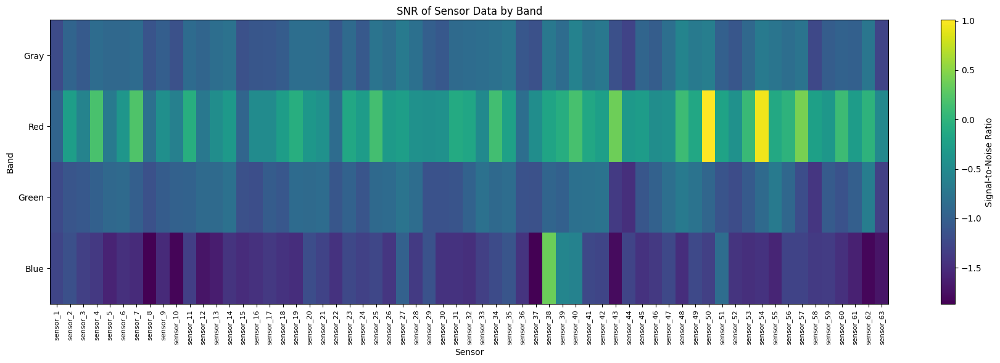

In [11]:
# Visualize the result as a heatmap
result_data = result_table_SNR.set_index('Sensor').T
result_data = result_data.apply(pd.to_numeric)  # Convert values to numeric data types
fig, ax = plt.subplots(figsize=(18, 6))
heatmap = ax.imshow(result_data, cmap='viridis', aspect='auto')
plt.colorbar(heatmap, ax=ax, label='Signal-to-Noise Ratio')
ax.set_xticks(np.arange(len(sensors)))
ax.set_xticklabels(sensors, rotation=90, fontsize=8)
ax.set_yticks(np.arange(len(result_data.index)))
ax.set_yticklabels(result_data.index)
ax.set_xlabel('Sensor')
ax.set_ylabel('Band')
ax.set_title('SNR of Sensor Data by Band')
plt.tight_layout()
plt.show()

In [17]:
# Calculate the average std for each band
average_SNR = result_table_SNR[['Gray', 'Red', 'Green', 'Blue']].mean(axis=0)

# Rank the bands based on their average std values
ranked_bands = average_SNR.sort_values(ascending=True)

# Print the result in blue color
print("\033[94mLess noisy:\033[0m")
for i, band in enumerate(ranked_bands.index):
    avg_std = average_std[band]
    print(f"{i+1}st: {band} (Avg SNR: {avg_std:.4f})")

Less noisy:
1st: Blue (Avg SNR: 0.6480)
2st: Green (Avg SNR: 0.7696)
3st: Gray (Avg SNR: 0.6450)
4st: Red (Avg SNR: 0.5621)


#

# band Visualization 

### Plot Green Band

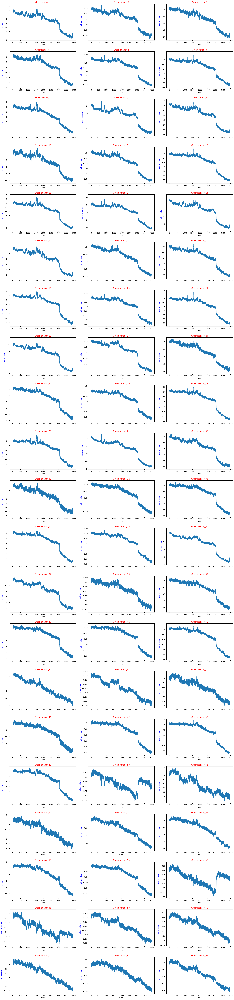

In [18]:
# Get the column names excluding the frame column
df = df_green
sensor_columns = df.columns[1:]

# Determine the number of subplots needed
num_subplots = len(sensor_columns)

# Set the layout of the subplots
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Plot the pixel variation for each sensor
for i, sensor in enumerate(sensor_columns):
    ax = axes[i] if num_subplots > 1 else axes
    ax.plot(df['time'], df[sensor])
    ax.set_title(f"Green:{sensor}", color='red')
    ax.set_xlabel('time')
    ax.set_ylabel('Pixel Variation', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis

# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()

#### Filtred Δ%R green data

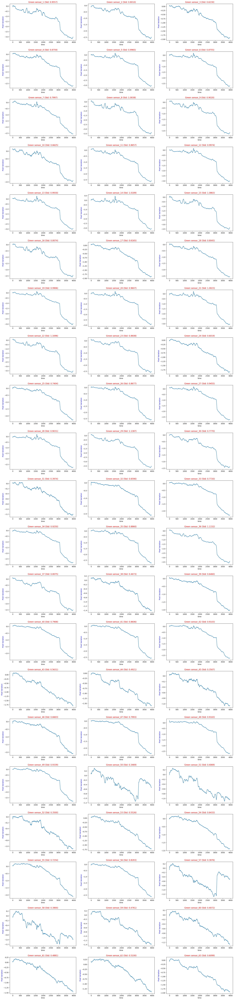

In [19]:
# Get the column names excluding the frame column
sensor_columns = df_green.columns[1:]

# Determine the number of subplots needed
num_subplots = len(sensor_columns)

# Set the layout of the subplots
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Apply moving average and plot the smoothed data
window_size = 50 # Adjust the window size as desired
for i, sensor in enumerate(sensor_columns):
    ax = axes[i] if num_subplots > 1 else axes
    filtered_data = df_green[sensor].rolling(window=window_size, min_periods=1).mean()
    ax.plot(df_green['time'], filtered_data) 
    std_value = np.std(df_green[sensor].rolling(window=window_size, min_periods=1).mean().iloc[window_size - 1:].values)
    ax.set_title(f"Green {sensor} (Std: {std_value:.4f})", color='red')
    ax.set_xlabel('time')
    ax.set_ylabel('Pixel Variation', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis


# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()

#

### Plot Gray band

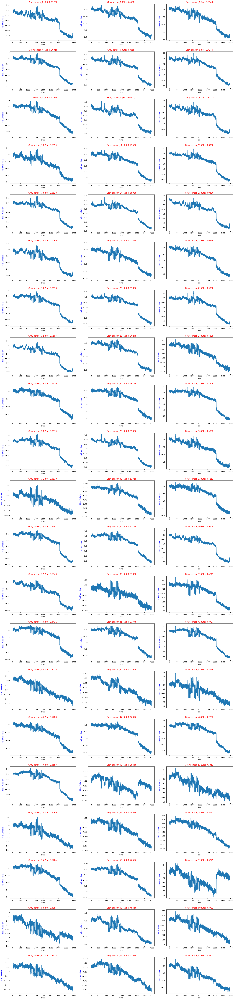

In [20]:
# Get the column names excluding the frame column
df = df_gray
sensor_columns = df.columns[1:]

# Determine the number of subplots needed
num_subplots = len(sensor_columns)

# Set the layout of the subplots
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Plot the pixel variation for each sensor
for i, sensor in enumerate(sensor_columns):
    ax = axes[i] if num_subplots > 1 else axes
    ax.plot(df['time'], df[sensor])
    std_value = np.std(df[sensor].values)
    ax.set_title(f"Gray {sensor} (Std: {std_value:.4f})", color='red')
    ax.set_xlabel('time')
    ax.set_ylabel('Pixel Variation', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis

# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()

#

### Plot Red band 

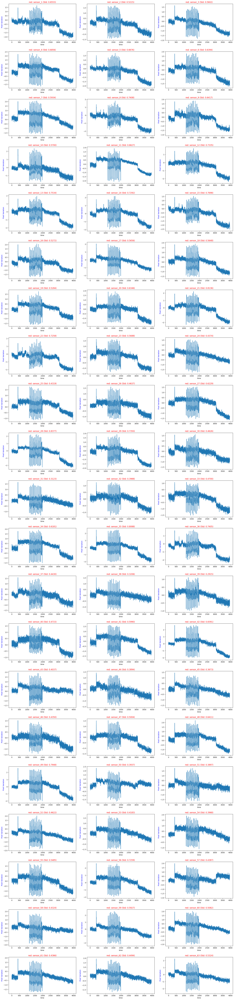

In [21]:
# Get the column names excluding the frame column
df = df_red
sensor_columns = df.columns[1:]

# Determine the number of subplots needed
num_subplots = len(sensor_columns)

# Set the layout of the subplots
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Plot the pixel variation for each sensor
for i, sensor in enumerate(sensor_columns):
    ax = axes[i] if num_subplots > 1 else axes
    ax.plot(df['time'], df[sensor])
    std_value = np.std(df[sensor].values)
    ax.set_title(f"red: {sensor} (Std: {std_value:.4f})", color='red')
    ax.set_xlabel('time')
    ax.set_ylabel('Pixel Variation', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis

# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()

#

### Plot Blue band

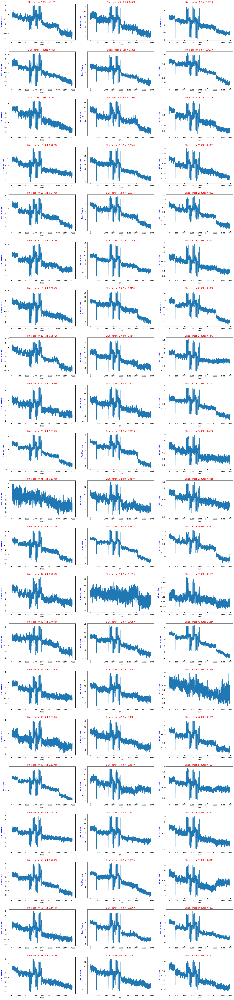

In [22]:
# Get the column names excluding the frame column
df = df_blue
sensor_columns = df.columns[1:]

# Determine the number of subplots needed
num_subplots = len(sensor_columns)

# Set the layout of the subplots
subplot_rows = int((num_subplots + 2) / 3)  # Adjust the number of rows as needed
subplot_cols = min(3, num_subplots)  # Adjust the number of columns as needed

# Create subplots
fig, axes = plt.subplots(subplot_rows, subplot_cols, figsize=(20, 4 * subplot_rows))  # Adjust the figure size as needed

# Flatten the axes array if necessary
axes = axes.flatten()

# Plot the pixel variation for each sensor
for i, sensor in enumerate(sensor_columns):
    ax = axes[i] if num_subplots > 1 else axes
    ax.plot(df['time'], df[sensor])
    std_value = np.std(df[sensor].values)
    ax.set_title(f"Blue: {sensor} (Std: {std_value:.4f})", color='red')
    ax.set_xlabel('time')
    ax.set_ylabel('Pixel Variation', color='blue')
    ax.margins(x=0.05)  # Add some margin to the x-axis

# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)  # Increase the padding between subplots

# Show the plot
plt.show()